### Modification to original: https://www.kaggle.com/code/dschettler8845/gislr-learn-eda-baseline

In [3]:
from IPython.display import IFrame, Markdown

<p id="toc"></p>
<h1 style="font-family: Verdana; font-size: 24px; font-style: normal; font-weight: bold; text-decoration: none; text-transform: none; letter-spacing: 3px; color: #FC796D; background-color: #ffffff;">TABLE OF CONTENTS</h1>

---

<h3 style="text-indent: 10vw; font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: black; background-color: #ffffff;"><a  style="text-decoration: none; color: #e06f64;" href="#background_information">2&nbsp;&nbsp;&nbsp;&nbsp;BACKGROUND INFORMATION</a></h3>

---

<h3 style="text-indent: 10vw; font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: black; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#imports">3&nbsp;&nbsp;&nbsp;&nbsp;IMPORTS</a></h3>

---

<h3 style="text-indent: 10vw; font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: black; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#setup">4&nbsp;&nbsp;&nbsp;&nbsp;SETUP & HELPER FUNCTIONS</a></h3>

---

<h3 style="text-indent: 10vw; font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: black; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#eda">5&nbsp;&nbsp;&nbsp;&nbsp;EXPLORATORY DATA ANALYSIS</a></h3>

---

<h3 style="text-indent: 10vw; font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: black; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#baseline">6&nbsp;&nbsp;&nbsp;&nbsp;BASELINE</a></h3>

---

<h3 style="text-indent: 10vw; font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: black; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#next_steps">7&nbsp;&nbsp;&nbsp;&nbsp;NEXT STEPS</a></h3>

---

<a id="background_information"></a>
<h1 style="font-family: Verdana; font-size: 24px; font-style: normal; font-weight: bold; text-decoration: none; text-transform: none; letter-spacing: 3px; background-color: #ffffff; color: #FC796D;" id="background_information">2&nbsp;&nbsp;BACKGROUND INFORMATION&nbsp;&nbsp;&nbsp;&nbsp;<a style="text-decoration: none; color: #e06f64;" href="#toc">&#10514;</a></h1>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;">2.1 OVERVIEW</h3>

---

<br>
<b style="text-decoration: underline; font-family: Verdana; text-transform: uppercase;">PRIMARY TASK DESCRIPTION</b>

<p>The Isolated Sign Language Recognition competition's goal is to classify isolated American Sign Language (ASL) signs. You will create a <a rel="noreferrer nofollow" target="_blank" href="https://www.tensorflow.org/lite">TensorFlow Lite</a> model trained on labeled landmark data extracted using the <a rel="noreferrer nofollow" target="_blank" href="https://google.github.io/mediapipe/solutions/holistic.html">MediaPipe Holistic Solution</a>.</p>

<b>The evaluation metric for this contest is <mark>simple classification accuracy.</mark></b>
<br>
<b style="text-decoration: underline; font-family: Verdana; text-transform: uppercase;">IMPORTANT RELEVANT TERMS</b>

<ul>
    <li><b>Mediapipe:</b> MediaPipe Holistic is a computer vision solution developed by Google's MediaPipe team. It combines multiple computer vision models to enable real-time multi-person tracking and understanding of human poses, facial landmarks, and hand gestures.</li>
    <li><b>American Sign Language (ASL):</b> A complete, natural language that employs signs made with the hands and other movements, including facial expressions and postures of the body, used primarily by people who are deaf or hard of hearing.</li>
    <li><b>TensorFlow Lite:</b> A lightweight and cross-platform framework for deploying machine learning models on mobile and embedded devices. It enables on-device machine learning inference with low latency and a small binary size.</li>
    <li><b>PopSign:</b> A smartphone game app that makes learning American Sign Language fun, interactive, and accessible. Players match videos of ASL signs with bubbles containing written English words to pop them.</li>
    <li><b>Landmark Data:</b> A set of labeled landmark data extracted from raw videos using the MediaPipe Holistic Solution. This dataset is used to train machine learning models for isolated American Sign Language recognition in the competition.</li>
    <li><b>Isolated Sign Language Recognition:</b> The task of classifying isolated American Sign Language signs. In the competition, participants create a TensorFlow Lite model trained on the provided landmark data to recognize the signs and improve PopSign's ability to help teach ASL to parents of deaf children.</li>
</ul>

<center><div style="background-color: #d1ecf1; border-color: #bee5eb; color: #0c5460; padding: 5px; width: 67%; margin-bottom: 10px; text-align: center; box-shadow: 2px 2px 4px #888888;">
    <h3 style="font-weight: bold;">Why <span style="font-family: Titillium Web, sans-serif; color: #FF6F00; margin: 0 !important;">TensorFlow</span> Lite</h3>
    <p style="margin: 0; padding: 0px 9% 10px 9%;">To allow the ML model to run on device in an attempt to limit latency inside the game, PopSign doesn’t send user videos to the cloud. Therefore, all inference must be done on the phone itself. PopSign is building its recognition pipeline on top of TensorFlow Lite, which runs on both Android and iOS. In order for the competition models to integrate seamlessly with PopSign, organizers have restricted participants to submit their entries in the form of TensorFlow Lite models.</p>
</div></center>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;">2.2 GLOSSARY</h3>

---

<h4>MediaPipe Landmarks for Hand only.</h4>
<img src="https://github.com/bishnarender/google-isolated-sign-language-recognition/assets/49610834/d1b326a5-7e0a-4bde-a5f8-75aa9c1155e4">

<h4>MediaPipe Landmarks for Full body only.</h4>
<img src="https://github.com/bishnarender/google-isolated-sign-language-recognition/assets/49610834/0c5fbec9-e996-45b6-a510-3f871f8cd6e4">

<mark>For ASL, the upper body landmarks are more important than the lower body landmarks.</mark>

---

<a id="islr"></a><br><b style="text-decoration: underline; font-family: Verdana; font-size: 120%; text-transform: uppercase;">Isolated Sign Language Recognition (ISLR)</b>

<a id="islr_definition"></a>
<br>

<ul>
  <li><b>What is ISLR?</b> ISLR (also known as word-level SLR) is the task of recognizing individual signs or tokens called glosses from a given segment of signing video clip. This is commonly seen as a classification problem when recognizing from isolated videos, but requires other things like video segmentation to be handled when used for real-time applications.</li>
</ul>

<b>Explain With Pictures</b>
<br>
<b><sub>American Sign Language Hand Gestures in Isolation</sub></b>
<img src="https://github.com/bishnarender/google-isolated-sign-language-recognition/assets/49610834/2d5ed4b7-e8aa-4afe-8187-64c2bfa0a684">

---

<a id="cslr"></a><br><b style="text-decoration: underline; font-family: Verdana; font-size: 120%; text-transform: uppercase;">Continuous Sign Language Recognition (CSLR)</b>

<a id="cslr_definition"></a>
<br>

<b>Textbook Definition (Key Points)</b>

<ul>
  <li><b>What is CSLR?</b> In CSLR (also known as sign language transcription), given a sign language sequence, the task is to predict all the signs (or glosses) in the video. This is more suitable for real-world transcription of sign languages. Depending on how it is solved, it can also sometimes be seen as an extension to the ISLR task.</li>
</ul>

---

<a id="Landmark"></a><br><b style="text-decoration: underline; font-family: Verdana; font-size: 120%; text-transform: uppercase;">Landmark data</b>

<a id="Landmark_definition"></a>
<br>

<b>Textbook Definition (Key Points)</b>

<ul>
    <li><b>What is Landmark Data:</b> Landmark data (keypoints) is a set of points on an object that are used to determine its shape, orientation, and location in space.</li>
    <li><b>Why do we care:</b> In the context of computer vision and machine learning, landmark data is often used to identify key features of an object or face, such as the corners of the eyes, the tip of the nose, or the corners of the mouth.</li>
    <li><b>How is Landmark Data represented:</b> Landmark data is often represented as a set of x, y, and z coordinates, or as a set of angles or distances between the points.</li>
</ul>

<a id="Landmark_eli5"></a>
<br>

<b>ELI5 Competition Definition</b>
<br>
Landmarks or keypoints are like dots that are placed on important areas of an object or a person's body. These dots help a computer to understand where these important areas are and how they are moving.

In the context of ISLR and MediaPipe, landmarks/keypoints are used to help a computer understand the movements of a person's hands and body when they are signing in sign language. <mark>By tracking the movements of these landmarks/keypoints, the computer can then recognize which sign the person is making.</mark>

Using keypoints/landmarks is way less computationally expensive than using video or images.
<br>
<a id="Landmark_visual"></a>
<br>
<b>Explain With Pictures</b>
<img src="https://github.com/bishnarender/google-isolated-sign-language-recognition/assets/49610834/979bec98-a4a6-4820-a5ca-a0bd940fe4ab">

---

<a id="imports"></a>
<h1 style="font-family: Verdana; font-size: 24px; font-style: normal; font-weight: bold; text-decoration: none; text-transform: none; letter-spacing: 3px; background-color: #ffffff; color: #FC796D;" id="imports">3&nbsp;&nbsp;IMPORTS&nbsp;&nbsp;&nbsp;&nbsp;<a style="text-decoration: none; color: #e06f64;" href="#toc">&#10514;</a></h1>

In [6]:
# !pip3 install -q --upgrade tensorflow-io
# try:
#     import mediapipe as mp
# except:
#     !pip install -q mediapipe
#     import mediapipe as mp


# mediapipe above

# Machine Learning and Data Science Imports (basics)
import tensorflow as tf
import tensorflow_io as tfio
import pandas as pd
import numpy as np
import sklearn

# Built-In Imports (mostly don't worry about these)
# from kaggle_datasets import KaggleDatasets
from collections import Counter
from datetime import datetime
from zipfile import ZipFile
from glob import glob
# import Levenshtein
import warnings
import requests
import hashlib
import imageio
import IPython
import sklearn
import urllib
import zipfile
import pickle
import random
import shutil
import string
import json
import math
import time
import gzip
import ast
import sys
import io
import os
import gc
import re

# Visualization Imports (overkill)
from matplotlib.animation import FuncAnimation
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
import matplotlib.patches as patches
import plotly.graph_objects as go
from IPython.display import HTML
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm; tqdm.pandas();
import plotly.express as px
import tifffile as tif
import seaborn as sns
from PIL import Image, ImageEnhance; Image.MAX_IMAGE_PIXELS = 5_000_000_000;
import matplotlib
from matplotlib import animation, rc
import plotly
import PIL
import cv2

import plotly.io as pio
print(pio.renderers)
# render => to give help, etc. to somebody.

def seed_it_all(seed=42):
    """ Attempt to be Reproducible """
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)

seed_it_all()

Renderers configuration
-----------------------
    Default renderer: 'plotly_mimetype+notebook'
    Available renderers:
        ['plotly_mimetype', 'jupyterlab', 'nteract', 'vscode',
         'notebook', 'notebook_connected', 'kaggle', 'azure', 'colab',
         'cocalc', 'databricks', 'json', 'png', 'jpeg', 'jpg', 'svg',
         'pdf', 'browser', 'firefox', 'chrome', 'chromium', 'iframe',
         'iframe_connected', 'sphinx_gallery', 'sphinx_gallery_png']



In [115]:
import mediapipe as mp
from mediapipe.framework.formats import landmark_pb2
from plotly.subplots import make_subplots
import itertools

<a id="setup"></a>
<h1 style="font-family: Verdana; font-size: 24px; font-style: normal; font-weight: bold; text-decoration: none; text-transform: none; letter-spacing: 3px; background-color: #ffffff; color: #FC796D;" id="setup">4&nbsp;&nbsp;SETUP AND HELPER FUNCTIONS&nbsp;&nbsp;&nbsp;&nbsp;<a style="text-decoration: none; color: #e06f64;" href="#toc">&#10514;</a></h1>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;">4.0 FUNCTIONS FROM OTHER KAGGLERS!</h3>

---

I want to use the incredible and useful functions built by other Kagglers. Resources are listed below with proper attribution and code is in the cell below.
<br>
<b style="font-family: Verdana; color: #FC796D;">Animation Function(s)</b>
<ul>    
    <li><b>Content Description:</b> Visualization of the coordinate data given to us with stabilization to remove jitter (in recent versions)</li>
    <li><b>Notebook Link: <a href="https://www.kaggle.com/code/danielpeshkov/animated-data-visualization">Animated Data Visualization</a></b></li>
    <li><b>Author (Profile Link): <a href="https://www.kaggle.com/danielpeshkov">danielpeshkov</a></b></li>
</ul>

In [7]:
def get_hand_points(hand):
    """Return x, y lists of normalized spatial coordinates for each finger in the hand dataframe."""
    def __get_hand_ax(_axis):
        return [np.nan_to_num(_x) for _x in 
            [hand.iloc[i][_axis] for i in range(5)]+\
            [[hand.iloc[i][_axis] for i in range(j, j+4)] for j in range(5, 21, 4)]+\
            [hand.iloc[i][_axis] for i in special_pts]]
    special_pts = [0, 5, 9, 13, 17, 0]
    return [__get_hand_ax(_ax) for _ax in ['x','y','z']]

def get_pose_points(pose):
    """
    Extracts x and y coordinates from the provided dataframe for pose landmarks.

    Args:
        pose (pandas.DataFrame): Dataframe containing pose landmarks with columns ['x', 'y', 'z', 'visibility', 'presence'].

    Returns:
        tuple: Two lists of x and y coordinates, respectively.

    """
    def __get_pose_ax(_axis):
        return [np.nan_to_num(_x) for _x in [
            [pose.iloc[i][_axis] for i in [8, 6, 5, 4, 0, 1, 2, 3, 7]], 
            [pose.iloc[i][_axis] for i in [10, 9]], 
            [pose.iloc[i][_axis] for i in [22, 16, 20, 18, 16, 14, 12, 11, 13, 15, 17, 19, 15, 21]], 
            [pose.iloc[i][_axis] for i in [12, 24, 26, 28, 30, 32, 28]], 
            [pose.iloc[i][_axis] for i in [11, 23, 25, 27, 29, 31, 27]], 
            [pose.iloc[i][_axis] for i in [24, 23]]
        ]]
    return [__get_pose_ax(_ax) for _ax in ['x','y','z']]


def animation_frame(f, event_df, ax, ax_pad=0.2, style="full", 
                    face_color="spring", pose_color="autumn", lh_color="winter", rh_color="summer"):
    """
    Function called by FuncAnimation to animate the plot with the provided frame.

    Args:
        f (int): The current frame number.

    Returns:
        None.
    """
    
    face_color = plt.cm.get_cmap(face_color)
    pose_color = plt.cm.get_cmap(pose_color)
    rh_color = plt.cm.get_cmap(rh_color)
    lh_color = plt.cm.get_cmap(lh_color)
    
    sign_df = event_df.copy()
    
    # Clear axis and fix the axis
    ax.clear()
    if style=="full":
        xmin = sign_df['x'].min() - ax_pad
        xmax = sign_df['x'].max() + ax_pad
        ymin = sign_df['y'].min() - ax_pad
        ymax = sign_df['y'].max() + ax_pad
    elif style=="hands":
        xmin = sign_df[sign_df.type.isin(["left_hand", "right_hand"])]['x'].min() - ax_pad
        xmax = sign_df[sign_df.type.isin(["left_hand", "right_hand"])]['x'].max() + ax_pad
        ymin = sign_df[sign_df.type.isin(["left_hand", "right_hand"])]['y'].min() - ax_pad
        ymax = sign_df[sign_df.type.isin(["left_hand", "right_hand"])]['y'].max() + ax_pad
    else:
        xmin = sign_df[sign_df.type==style]['x'].min() - ax_pad
        xmax = sign_df[sign_df.type==style]['x'].max() + ax_pad
        ymin = sign_df[sign_df.type==style]['y'].min() - ax_pad
        ymax = sign_df[sign_df.type==style]['y'].max() + ax_pad
    
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.axis(False) # Remove the axis lines
    
    # Normalize depth
    zmin, zmax = sign_df['z'].min(), sign_df['z'].max()
    sign_df['z'] = (sign_df['z']-zmin)/(zmax-zmin)
    
    # Get data for current frame
    frame = sign_df[sign_df.frame==f]
    
    # Left Hand
    if style.lower() in ["left_hand", "hands", "full"]:
        left = frame[frame.type=='left_hand']
        lx, ly, lz = get_hand_points(left)
        for i in range(len(lx)):
            if type(lx[i])!=np.float64:
                lh_clr = [lh_color(((np.abs(_x)+np.abs(_y))/2)) for _x, _y in zip(lx[i], ly[i])]
                lh_clr = tuple(sum(_x)/len(_x) for _x in zip(*lh_clr))
            else: 
                lh_clr = lh_color(((np.abs(lx[i])+np.abs(ly[i]))/2))
            ax.plot(lx[i], ly[i], color=lh_clr, alpha=lz[i].mean())
    
    # Right Hand
    if style.lower() in ["right_hand", "hands", "full"]:
        right = frame[frame.type=='right_hand']
        rx, ry, rz = get_hand_points(right)
        for i in range(len(rx)):
            if type(rx[i])!=np.float64:
                rh_clr = [rh_color((np.abs(_x)+np.abs(_y))/2) for _x, _y in zip(rx[i], ry[i])] 
                rh_clr = tuple(sum(_x)/len(_x) for _x in zip(*rh_clr))
            else:
                rh_clr = rh_color(((np.abs(rx[i])+np.abs(ry[i]))/2))
            ax.plot(rx[i], ry[i], color=rh_clr, alpha=rz[i].mean())
    
    # Pose
    if style.lower() in ["pose", "full"]:
        pose = frame[frame.type=='pose']
        px, py, pz = get_pose_points(pose)
        for i in range(len(px)):
            if type(px[i])!=np.float64:
                pose_clr = [pose_color(((np.abs(_x)+np.abs(_y))/2)) for _x, _y in zip(px[i], py[i])]
                pose_clr = tuple(sum(_x)/len(_x) for _x in zip(*pose_clr))
            else: 
                pose_clr = pose_color(((np.abs(px[i])+np.abs(py[i]))/2))
            ax.plot(px[i], py[i], color=pose_clr, alpha=pz[i].mean())
        
    if style.lower() in ["face", "full"]:
        face = frame[frame.type=='face'][['x', 'y', 'z']].values
        fx, fy, fz = face[:,0], face[:,1], face[:,2]
        for i in range(len(fx)):
            ax.plot(fx[i], fy[i], '.', color=pose_color(fz[i]), alpha=fz[i])
    
    # Use this so we don't get an extra return
    plt.close()
    
    
def plot_event(event_df, style="full"):
    # Create figure and animation
    fig, ax = plt.subplots()
    l, = ax.plot([], [])
    animation = FuncAnimation(fig, func=lambda x: animation_frame(x, event_df, ax, style=style), 
                              frames=event_df["frame"].unique())
    
    # Display animation as HTML5 video
    return HTML(animation.to_html5_video())

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;">4.1 HELPER FUNCTIONS</h3>

---

In [8]:
def flatten_l_o_l(nested_list):
    """Flatten a list of lists into a single list.

    Args:
        nested_list (list): 
            – A list of lists (or iterables) to be flattened.

    Returns:
        list: A flattened list containing all items from the input list of lists.
    """
    return [item for sublist in nested_list for item in sublist]


def print_ln(symbol="-", line_len=110, newline_before=False, newline_after=False):
    """Print a horizontal line of a specified length and symbol.

    Args:
        symbol (str, optional): 
            – The symbol to use for the horizontal line
        line_len (int, optional): 
            – The length of the horizontal line in characters
        newline_before (bool, optional): 
            – Whether to print a newline character before the line
        newline_after (bool, optional): 
            – Whether to print a newline character after the line
    """
    if newline_before: print();
    print(symbol * line_len)
    if newline_after: print();
        
        
def read_json_file(file_path):
    """Read a JSON file and parse it into a Python object.

    Args:
        file_path (str): The path to the JSON file to read.

    Returns:
        dict: A dictionary object representing the JSON data.
        
    Raises:
        FileNotFoundError: If the specified file path does not exist.
        ValueError: If the specified file path does not contain valid JSON data.
    """
    try:
        # Open the file and load the JSON data into a Python object
        with open(file_path, 'r') as file:
            json_data = json.load(file)
        return json_data
    except FileNotFoundError:
        # Raise an error if the file path does not exist
        raise FileNotFoundError(f"File not found: {file_path}")
    except ValueError:
        # Raise an error if the file does not contain valid JSON data
        raise ValueError(f"Invalid JSON data in file: {file_path}")
        
def get_sign_df(pq_path, invert_y=True):
    sign_df = pd.read_parquet(pq_path)
    
    # y value is inverted (Thanks @danielpeshkov)
    if invert_y: sign_df["y"] *= -1 
        
    return sign_df


ROWS_PER_FRAME = 543  # number of landmarks per frame
def load_relevant_data_subset(pq_path):
    data_columns = ['x', 'y', 'z']
    data = pd.read_parquet(pq_path, columns=data_columns)
    n_frames = int(len(data) / ROWS_PER_FRAME)
    data = data.values.reshape(n_frames, ROWS_PER_FRAME, len(data_columns))
    return data.astype(np.float32)

<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;">4.2 LOAD DATA</h3>

---


In [10]:
# Define the path to the root data directory
DATA_DIR         = ""#/kaggle/input/asl-signs
EXTEND_TRAIN_DIR = "/kaggle/input/gislr-extended-train-dataframe" 

print("\n... BASIC DATA SETUP STARTING ...\n")
print("\n\n... LOAD TRAIN DATAFRAME FROM CSV FILE ...\n")

LOAD_EXTENDED = False#True
if LOAD_EXTENDED and os.path.isfile(os.path.join(EXTEND_TRAIN_DIR, "extended_train.csv")):
    train_df = pd.read_csv(os.path.join(EXTEND_TRAIN_DIR, "extended_train.csv"))
else:
    train_df = pd.read_csv(os.path.join(DATA_DIR, "train.csv"))
    train_df["path"] = DATA_DIR+"/"+train_df["path"]
display(train_df)

print("\n\n... LOAD SIGN TO PREDICTION INDEX MAP FROM JSON FILE ...\n")
s2p_map = {k.lower():v for k,v in read_json_file(os.path.join(DATA_DIR, "sign_to_prediction_index_map.json")).items()}
p2s_map = {v:k for k,v in read_json_file(os.path.join(DATA_DIR, "sign_to_prediction_index_map.json")).items()}
encoder = lambda x: s2p_map.get(x.lower())
decoder = lambda x: p2s_map.get(x)
print(s2p_map)

DEMO_ROW = 283
print(f"\n\n... DEMO SIGN/EVENT DATAFRAME FOR ROW {DEMO_ROW} - SIGN={train_df.iloc[DEMO_ROW]['sign']} ...\n")
demo_sign_df = get_sign_df(train_df.iloc[DEMO_ROW]["path"][1:])#[1:]
display(demo_sign_df)

# I messed this function up... will fix later
plot_event(demo_sign_df)


... BASIC DATA SETUP STARTING ...



... LOAD TRAIN DATAFRAME FROM CSV FILE ...



,path,participant_id,sequence_id,sign
0,/train_landmark_files/26734/1000035562.parquet,26734,1000035562,blow
1,/train_landmark_files/28656/1000106739.parquet,28656,1000106739,wait
2,/train_landmark_files/16069/100015657.parquet,16069,100015657,cloud
3,/train_landmark_files/25571/1000210073.parquet,25571,1000210073,bird
4,/train_landmark_files/62590/1000240708.parquet,62590,1000240708,owie
...,...,...,...,...
94472,/train_landmark_files/53618/999786174.parquet,53618,999786174,white
94473,/train_landmark_files/26734/999799849.parquet,26734,999799849,have
94474,/train_landmark_files/25571/999833418.parquet,25571,999833418,flower
94475,/train_landmark_files/29302/999895257.parquet,29302,999895257,room




... LOAD SIGN TO PREDICTION INDEX MAP FROM JSON FILE ...

{'tv': 0, 'after': 1, 'airplane': 2, 'all': 3, 'alligator': 4, 'animal': 5, 'another': 6, 'any': 7, 'apple': 8, 'arm': 9, 'aunt': 10, 'awake': 11, 'backyard': 12, 'bad': 13, 'balloon': 14, 'bath': 15, 'because': 16, 'bed': 17, 'bedroom': 18, 'bee': 19, 'before': 20, 'beside': 21, 'better': 22, 'bird': 23, 'black': 24, 'blow': 25, 'blue': 26, 'boat': 27, 'book': 28, 'boy': 29, 'brother': 30, 'brown': 31, 'bug': 32, 'bye': 33, 'callonphone': 34, 'can': 35, 'car': 36, 'carrot': 37, 'cat': 38, 'cereal': 39, 'chair': 40, 'cheek': 41, 'child': 42, 'chin': 43, 'chocolate': 44, 'clean': 45, 'close': 46, 'closet': 47, 'cloud': 48, 'clown': 49, 'cow': 50, 'cowboy': 51, 'cry': 52, 'cut': 53, 'cute': 54, 'dad': 55, 'dance': 56, 'dirty': 57, 'dog': 58, 'doll': 59, 'donkey': 60, 'down': 61, 'drawer': 62, 'drink': 63, 'drop': 64, 'dry': 65, 'dryer': 66, 'duck': 67, 'ear': 68, 'elephant': 69, 'empty': 70, 'every': 71, 'eye': 72, 'face': 73, '

,frame,row_id,type,landmark_index,x,y,z
0,23,23-face-0,face,0,0.381393,-0.377334,-0.045009
1,23,23-face-1,face,1,0.387510,-0.333088,-0.060799
2,23,23-face-2,face,2,0.384334,-0.349668,-0.037500
3,23,23-face-3,face,3,0.377555,-0.302792,-0.038101
4,23,23-face-4,face,4,0.388338,-0.322209,-0.062246
...,...,...,...,...,...,...,...
9226,39,39-right_hand-16,right_hand,16,NaN,NaN,NaN
9227,39,39-right_hand-17,right_hand,17,NaN,NaN,NaN
9228,39,39-right_hand-18,right_hand,18,NaN,NaN,NaN
9229,39,39-right_hand-19,right_hand,19,NaN,NaN,NaN


<a id="eda"></a>

<h1 style="font-family: Verdana; font-size: 24px; font-style: normal; font-weight: bold; text-decoration: none; text-transform: none; letter-spacing: 3px; background-color: #ffffff; color: #FC796D;" id="eda">5&nbsp;&nbsp;EXPLORATORY DATA ANALYSIS&nbsp;&nbsp;&nbsp;&nbsp;<a style="text-decoration: none; color: #e06f64;" href="#toc">&#10514;</a></h1>
<br>

<b>Initially we will sample approximately 10% of the data to probe, as it is very computationally expensive to open and close all the parquet files. Following my interactive EDA I will switch this percentage to be 100% and allow it to run overnight</b>
* We will then use the subsampled dataset along with the original to explore the columns and respective parquet files for each isolated sign

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;">5.0 SUBSAMPLE THE TRAIN DATA</h3>

---

In [13]:
# During interactive --> 0.001 (0.1%)
# Save and run-all   --> 1.000 (100%)

PCT_TO_EXAMINE = 0.001
if PCT_TO_EXAMINE < 1.0:
    subsample_train_df = train_df.sample(frac=PCT_TO_EXAMINE, random_state=42).reset_index(drop=True)
else:
    subsample_train_df = train_df.copy()

# remove extra columns to show what we're doing
subsample_train_df=subsample_train_df[["path", "participant_id", "sequence_id", "sign"]]
display(subsample_train_df)

,path,participant_id,sequence_id,sign
0,/train_landmark_files/28656/3311214787.parquet,28656,3311214787,sticky
1,/train_landmark_files/53618/3588192588.parquet,53618,3588192588,before
2,/train_landmark_files/4718/1363575346.parquet,4718,1363575346,pretty
3,/train_landmark_files/37779/951199059.parquet,37779,951199059,hen
4,/train_landmark_files/36257/283190141.parquet,36257,283190141,tomorrow
...,...,...,...,...
89,/train_landmark_files/22343/2499821466.parquet,22343,2499821466,pizza
90,/train_landmark_files/30680/2427202243.parquet,30680,2427202243,farm
91,/train_landmark_files/53618/532239954.parquet,53618,532239954,outside
92,/train_landmark_files/4718/3232372656.parquet,4718,3232372656,water


<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;">5.1 EXAMINE THE `PATH` COLUMN</h3>

---

There's not much here. The path column is simply the path to the landmark file (parquet).
* Every row and respective filepath is unique
* Every path is comprised of.
    * The base part of the path --> **`/kaggle/input/asl-signs/train_landmark_files`**
    * The <b><code>participant_id</code></b> --> .../16069
    * The <b><code>sequence_id</code></b> as the parquet filename --> .../100015657.parquet

In [11]:
print("\n... LETS LOOK AT THE PATH COLUMN AND ENSURE ALL PATHS ARE UNIQUE:")
display(train_df["path"].describe().to_frame())


... LETS LOOK AT THE PATH COLUMN AND ENSURE ALL PATHS ARE UNIQUE:


,path
count,94477
unique,94477
top,/train_landmark_files/26734/1000035562.parquet
freq,1


<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;">5.2 EXAMINE THE `PARTICIPANT_ID` COLUMN</h3>

---

<ul>
    <li><b>Number Participants</b>: 21</li>
    <li><b>Average Number of Rows Per Participant</b>: 4498.91</li>
    <li><b>Standard Deviation in Counts Per Participant</b>: 490.77</li>
    <li><b>Minimum Number of Examples For One Participant</b>: 3338</li>
    <li><b>Maximum Number of Examples For One Participant</b>: 4968</li>
</ul>

It's also worth pointing out that the folders in the train_landmark_files directory are named based on the participant_id for whom the respective isolated sign event parquet files are for.

In [14]:
print("\n... BASICS OF THE PARTICIPANT ID COLUMN:\n")
display(train_df["participant_id"].astype(str).describe().to_frame().T)

print("\n... WE GET THE COUNT MAP AND GET BASIC STATISTICS:")
participant_count_map = train_df["participant_id"].value_counts().to_dict()
print("\t1. Number of Unique Participants                  -->", len(participant_count_map))
print("\t2. Average Number of Rows Per Participant         -->", np.array(list(participant_count_map.values())).mean())
print("\t3. Standard Deviation in Counts Per Participant   -->", np.array(list(participant_count_map.values())).std())
print("\t4. Minimum Number of Examples For One Participant -->", np.array(list(participant_count_map.values())).min())
print("\t5. Maximum Number of Examples For One Participant -->", np.array(list(participant_count_map.values())).max())

print("\n\n... PARTICIPANT ID COLUMN HISTOGRAM:\n")
fig = px.histogram(
    train_df, x=train_df["participant_id"].astype(str), color="participant_id",
    labels={"x":"<b>Participant ID</b>", "count":"<b>Total Row Count</b>"}, title="<b>Row Counts by Participant ID</b>",
    category_orders={"participant_id": train_df["participant_id"].value_counts().index}
)
fig.update_yaxes(title_text="<b>Total Row Count</b>")
fig.update_layout(showlegend=False)
fig.show()

print("\n... GOING FORWARD WE SET THIS COLUMN TO BE A STRING")
train_df["participant_id"] = train_df["participant_id"].astype(str)
subsample_train_df["participant_id"] = subsample_train_df["participant_id"].astype(str)


... BASICS OF THE PARTICIPANT ID COLUMN:



,count,unique,top,freq
participant_id,94477,21,49445,4968



... WE GET THE COUNT MAP AND GET BASIC STATISTICS:
	1. Number of Unique Participants                  --> 21
	2. Average Number of Rows Per Participant         --> 4498.9047619047615
	3. Standard Deviation in Counts Per Participant   --> 490.7731417304649
	4. Minimum Number of Examples For One Participant --> 3338
	5. Maximum Number of Examples For One Participant --> 4968


... PARTICIPANT ID COLUMN HISTOGRAM:




... GOING FORWARD WE SET THIS COLUMN TO BE A STRING


<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;">5.3 EXAMINE THE `SEQUENCE_ID` COLUMN</h3>

---

There's not much here. This is a unique value assigned to every isolated sequence/event. One sequence corresponds to a single isolated sign that we have to detect and label.
* Every value is unique for every row


In [9]:
print("\n... LETS LOOK AT THE PATH COLUMN AND ENSURE ALL PATHS ARE UNIQUE:")
display(train_df["sequence_id"].astype(str).describe().to_frame())

print("\n... TO CONFIRM... LET'S CHECK HOW MANY PARQUET FILES WE HAVE:")
print("\t--> ", len(glob(os.path.join(DATA_DIR, "**", "**", "*.parquet"))))


... LETS LOOK AT THE PATH COLUMN AND ENSURE ALL PATHS ARE UNIQUE:


,sequence_id
count,94477
unique,94477
top,1000035562
freq,1



... TO CONFIRM... LET'S CHECK HOW MANY PARQUET FILES WE HAVE:
	-->  94477


<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;">5.4 EXAMINE THE `SIGN` COLUMN</h3>

---

<b>This is the <span style="color: #FC796D;"><u>label</u></span> for each respective event/sequence.</b>
    
<ul>
    <li><b>Number Of Unique Signs</b>: 250</li>
    <li><b>Average Number of Rows Per Sign</b>: 377.908</li>
    <li><b>Standard Deviation in Counts Per Sign</b>: 19.356537293638034</li>
    <li><b>Minimum Number of Examples For One Sign</b>: 299</li>
    <li><b>Maximum Number of Examples For One Sign</b>: 415</li>
</ul>

It's a pretty balanced dataset!

In [15]:
print("\n... BASICS OF THE PARTICIPANT ID COLUMN:\n")
display(train_df["sign"].describe().to_frame().T)

print("\n... WE GET THE COUNT MAP AND GET BASIC STATISTICS:")
sign_count_map = train_df["sign"].value_counts().to_dict()
print("\t1. Number Of Unique Signs                  -->", len(sign_count_map))
print("\t2. Average Number of Rows Per Sign         -->", np.array(list(sign_count_map.values())).mean())
print("\t3. Standard Deviation in Counts Per Sign   -->", np.array(list(sign_count_map.values())).std())
print("\t4. Minimum Number of Examples For One Sign -->", np.array(list(sign_count_map.values())).min())
print("\t5. Maximum Number of Examples For One Sign -->", np.array(list(sign_count_map.values())).max())

print("\n\n... SIGN COLUMN HISTOGRAM:\n")

# fig = px.histogram(train_df, y=train_df["sign"], color="sign", orientation="h", height=5000,
#     labels={"y":"<b>Sign (label)</b>", "count":"<b>Total Row Count</b>"}, title="<b>Row Counts by Sign (label)</b>",
#     category_orders={"sign": train_df["sign"].value_counts().index}
# )
# fig.update_yaxes(title_text="<b>Total Row Count</b>")
# fig.update_layout(showlegend=False)
# fig.show()


... BASICS OF THE PARTICIPANT ID COLUMN:



,count,unique,top,freq
sign,94477,250,listen,415



... WE GET THE COUNT MAP AND GET BASIC STATISTICS:
	1. Number Of Unique Signs                  --> 250
	2. Average Number of Rows Per Sign         --> 377.908
	3. Standard Deviation in Counts Per Sign   --> 19.356537293638034
	4. Minimum Number of Examples For One Sign --> 299
	5. Maximum Number of Examples For One Sign --> 415


... SIGN COLUMN HISTOGRAM:



<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;">5.5 INCLUDING SEQUENCE METADATA IN TRAIN DATAFRAME</h3>

---

<b>We are going to identify certain pieces of relevant metadata that we want to scrape from the parquet files and include in our main dataframe</b>

<br>

<b><u>We will retrieve the following for each sequence</u></b>
<ul>
    <li>start_frame</li>
    <li>end_frame</li>
    <li>total_frames</li>
    <li>face_count</li>
    <li>pose_count</li>
    <li>left_hand_count</li>
    <li>right_hand_count</li>
    <li>x_min</li>
    <li>x_max</li>
    <li>y_min</li>
    <li>y_max</li>
    <li>z_min</li>
    <li>z_max</li>
</ul>


<b>What can we observe about the sequences (sequenced IDs)  with this new metadata:</b>
<ul>
    <li><b>There are always the same keypoints present</b></li>
    <li>For "each part of the body" (i.e., type) we have the following keypoint/point/landmark counts:<ul>
        <li>Right Hand --> 21 keypoints/points/landmarks</li>
        <li>Left Hand  --> 21 keypoints/points/landmarks</li>
        <li>Pose --> 33 keypoints/points/landmarks</li>
        <li>Face --> 468 keypoints/points/landmarks</li></ul>
    </li>
    <li><b>Sequences can start almost anywhere</b> from frame 0 to frame 484 but the <b>mean is ~30</b></li>
    <li><b>Sequences can end almost anywhere</b> from frame 1 to frame 499 but the <b>mean is ~67</b></li>
    <li><b>Sequences can be different lengths (and are inclusive of their bounds)</b> from a length of 2 to a length of <font color="red">500</font>. Sequences have a <b>mean length (average frames) of ~37</b></li>
</ul>

In [18]:
# view sample parquet file.
print(len(demo_sign_df))
demo_sign_df.head(3)

9231


,frame,row_id,type,landmark_index,x,y,z
0,23,23-face-0,face,0,0.381393,-0.377334,-0.045009
1,23,23-face-1,face,1,0.387510,-0.333088,-0.060799
2,23,23-face-2,face,2,0.384334,-0.349668,-0.037500


In [120]:
# # rows_per_frame from sample parquet file.
print(len(demo_sign_df[demo_sign_df.frame==23]))
print(len(demo_sign_df[demo_sign_df.frame==24]))
print(len(demo_sign_df[demo_sign_df.frame==25]))

543
543
543


In [19]:
def get_seq_meta(row, invert_y=True, do_counts=False):
    """Calculates and adds metadata to the given row of sign language event data.
    
    Args:
        row (pandas.core.series.Series): A row of sign language event data containing columns:
            path: The file path to the Parquet file containing the landmark data for the event.
        invert_y (bool, optional): Whether to invert the y-coordinate of each landmark. Defaults to True.
    
    Returns:
        pandas.core.series.Series: The input row with added metadata columns:
            start_frame: The frame number of the first frame in the event.
            end_frame: The frame number of the last frame in the event.
            total_frames: The number of frames in the event.
            face_count: The number of landmarks in the 'face' type. [optional]
            pose_count: The number of landmarks in the 'pose' type. [optional]
            left_hand_count: The number of landmarks in the 'left_hand' type. [optional]
            right_hand_count: The number of landmarks in the 'right_hand' type. [optional]
            x_min: The minimum x-coordinate value of any landmark in the event.
            x_max: The maximum x-coordinate value of any landmark in the event.
            y_min: The minimum y-coordinate value of any landmark in the event.
            y_max: The maximum y-coordinate value of any landmark in the event.
            z_min: The minimum z-coordinate value of any landmark in the event.
            z_max: The maximum z-coordinate value of any landmark in the event.
    """
    # Extract the sign language event data from the Parquet file at the given path
    df = get_sign_df(row['path'][1:], invert_y=invert_y)#[1:]
    
    # Count the number of landmarks in each type
    type_counts = df['type'].value_counts(dropna=False).to_dict()
    nan_counts  = df.groupby("type")["x"].apply(lambda x: x.isna().sum())
    
    # Calculate metadata for the event and add it to the input row
    row['start_frame'] = df['frame'].min()
    row['end_frame'] = df['frame'].max()
    row['total_frames'] = df['frame'].nunique()
    
    if do_counts:
        for _type in ["face", "pose", "left_hand", "right_hand"]:
            row[f'{_type}_count'] = type_counts[_type]
            row[f'{_type}_nan_count'] = nan_counts[_type]
        
    for coord in ['x', 'y', 'z']:
        row[f'{coord}_min'] = df[coord].min()
        row[f'{coord}_max'] = df[coord].max()
    
    return row

type_kp_map = dict(face=468, left_hand=21, pose=33, right_hand=21)
col_order = [
    'path', 'participant_id', 'sequence_id', 'sign', 'start_frame', 'end_frame', 'total_frames', 
    'face_nan_count', 'face_nan_pct', 'left_hand_nan_count', 'left_hand_nan_pct', 'pose_nan_count', 'pose_nan_pct',
    'right_hand_nan_count', 'right_hand_nan_pct', 'x_min', 'x_max', 'y_min', 'y_max', 'z_min', 'z_max',
]

if not LOAD_EXTENDED:
    # Will take around 5-10 minutes on subsample and around 50-100 minutes on the full dataset
    subsample_train_df = subsample_train_df.progress_apply(lambda x: get_seq_meta(x, do_counts=True), axis=1)
    for _type, _count in type_kp_map.items():
        subsample_train_df[f"{_type}_appears_pct"] = subsample_train_df[f"{_type}_count"]/(subsample_train_df[f"total_frames"]*_count)
        subsample_train_df[f"{_type}_nan_pct"]     = subsample_train_df[f"{_type}_nan_count"]/(subsample_train_df[f"total_frames"]*_count)
    # Extended save for later...
    subsample_train_df.to_csv("extended_train.csv", index=False)
    display(subsample_train_df)
else:
    del subsample_train_df
    for _type, _count in type_kp_map.items():
            train_df[f"{_type}_appears_pct"] = train_df[f"{_type}_count"]/(train_df[f"total_frames"]*_count)
            train_df[f"{_type}_nan_pct"]     = train_df[f"{_type}_nan_count"]/(train_df[f"total_frames"]*_count)
    train_df = train_df[col_order]
    display(train_df)

  0%|          | 0/94 [00:00<?, ?it/s]

,path,participant_id,sequence_id,sign,start_frame,end_frame,total_frames,face_count,face_nan_count,pose_count,...,z_min,z_max,face_appears_pct,face_nan_pct,left_hand_appears_pct,left_hand_nan_pct,pose_appears_pct,pose_nan_pct,right_hand_appears_pct,right_hand_nan_pct
0,/train_landmark_files/28656/3311214787.parquet,28656,3311214787,sticky,22,42,21,9828,0,693,...,-2.455090,2.119155,1.0,0.000000,1.0,1.000000,1.0,0.0,1.0,0.000000
1,/train_landmark_files/53618/3588192588.parquet,53618,3588192588,before,12,112,101,47268,0,3333,...,-3.773157,2.343476,1.0,0.000000,1.0,1.000000,1.0,0.0,1.0,0.683168
2,/train_landmark_files/4718/1363575346.parquet,4718,1363575346,pretty,1,127,127,59436,0,4191,...,-3.353845,2.562279,1.0,0.000000,1.0,1.000000,1.0,0.0,1.0,0.275591
3,/train_landmark_files/37779/951199059.parquet,37779,951199059,hen,18,26,9,4212,0,297,...,-2.383077,1.343466,1.0,0.000000,1.0,1.000000,1.0,0.0,1.0,0.000000
4,/train_landmark_files/36257/283190141.parquet,36257,283190141,tomorrow,59,109,51,23868,0,1683,...,-2.751159,1.393625,1.0,0.000000,1.0,0.117647,1.0,0.0,1.0,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89,/train_landmark_files/22343/2499821466.parquet,22343,2499821466,pizza,27,47,21,9828,0,693,...,-1.923812,1.336504,1.0,0.000000,1.0,0.000000,1.0,0.0,1.0,1.000000
90,/train_landmark_files/30680/2427202243.parquet,30680,2427202243,farm,20,30,11,5148,1872,363,...,-2.641979,2.520685,1.0,0.363636,1.0,1.000000,1.0,0.0,1.0,0.636364
91,/train_landmark_files/53618/532239954.parquet,53618,532239954,outside,21,27,7,3276,0,231,...,-3.225456,2.095151,1.0,0.000000,1.0,1.000000,1.0,0.0,1.0,0.000000
92,/train_landmark_files/4718/3232372656.parquet,4718,3232372656,water,0,2,3,1404,0,99,...,-2.128868,1.611341,1.0,0.000000,1.0,1.000000,1.0,0.0,1.0,0.000000


<b>The following plot shows the general distributions (independently plotted).</b>
* <b>Note the Y axis is log scale.</b>
* 0.0 (Left Side) - Indicates that no values are missing
* 1.0 (Right Side) - Indicates that all values are missing
<br>

<b>Quick Takeaways</b>
* Face points can be NaN although it is less common than in the Hand data
* Pose points are never NaN
* Left and Right hand distributions are similar but Right Hand is full NaN less than Left Hand
* Pose, Left-Hand, and Right-Hand all have intermediate (not all missing or all present) sequences, however, they are less common than the case where all points are NaN or valid.

In [22]:
def title_map_fn(ann):
    title_map = {
    'face_nan_pct': '<b>Percentage Of <i>Face</i> Data Points That Are NaN</b>', 
    'left_hand_nan_pct': '<b>Percentage Of <i>Left Hand</i> Data Points That Are NaN</b>',
    'pose_nan_pct': '<b>Percentage Of <i>Pose</i> Data Points That Are NaN</b>',
    'right_hand_nan_pct': '<b>Percentage Of <i>Right Hand</i> Data Points That Are NaN</b>'}
    ann.text = title_map.get(ann.text[1:])
    
fig = px.histogram(subsample_train_df, ["face_nan_pct", "left_hand_nan_pct", "pose_nan_pct", "right_hand_nan_pct"], height=750,
                   labels={'variable': '', 'count': '<b>Frequency (LOG)</b>', 'value':"<b>Percentage of Points That Are NaN</b>"}, log_y=True, facet_col='variable', nbins=20, opacity=0.75,
                   facet_col_wrap=2, facet_col_spacing=0.05)# train_df or subsample_train_df
fig.update_yaxes(title_text='<b>Frequency (LOG)</b>', col=1)
fig.for_each_annotation(title_map_fn)
fig.update_layout(showlegend=False)
fig.show()

In [24]:
demo_sign_df.head(3)

,frame,row_id,type,landmark_index,x,y,z
0,23,23-face-0,face,0,0.381393,-0.377334,-0.045009
1,23,23-face-1,face,1,0.387510,-0.333088,-0.060799
2,23,23-face-2,face,2,0.384334,-0.349668,-0.037500


In [46]:
# # Check that all the frames in all the files have the same ordering
# for _path in tqdm(train_df.sample(n=500, random_state=42).reset_index(drop=True)["path"].values, total=500):
#     for _frame_types in get_sign_df(_path).groupby("frame")["type"].apply(list).values:
#         current_idx = 0
#         face_check = _frame_types[current_idx:current_idx+type_kp_map["face"]].count("face")==type_kp_map["face"]
#         current_idx+=type_kp_map["face"]
#         if not face_check:
#             print("face")
#             raise ValueError()
#         lh_check   = _frame_types[current_idx:current_idx+type_kp_map["left_hand"]].count("left_hand")==type_kp_map["left_hand"]
#         current_idx+=type_kp_map["left_hand"]
#         if not lh_check:
#             print("lh")
#             raise ValueError()
#         pose_check = _frame_types[current_idx:current_idx+type_kp_map["pose"]].count("pose")==type_kp_map["pose"]
#         current_idx+=type_kp_map["pose"]
#         if not pose_check:
#             print("pose")
#             raise ValueError()
#         rh_check   = _frame_types[current_idx:current_idx+type_kp_map["right_hand"]].count("right_hand")==type_kp_map["right_hand"]
#         if not rh_check:
#             print("rh")
#             raise ValueError()

# demo_sign_df.groupby("frame")["type"].apply(list).head(3) =>
# frame
# 23    [face, face, face, face, face, face, face, fac...
# 24    [face, face, face, face, face, face, face, fac...
# 25    [face, face, face, face, face, face, face, fac...
# Name: type, dtype: object

# landmark_index start at 0 for each respective "type" and count up.
# ...).values[0] => list present at 0th index i.e., in front of frame=23.
FRAME_TYPE_ORDER_DETAIL = demo_sign_df.groupby("frame")["type"].apply(list).values[0]
FRAME_TYPE_ORDER = sorted(set(FRAME_TYPE_ORDER_DETAIL))

print(FRAME_TYPE_ORDER)
print(type_kp_map)


FRAME_TYPE_IDX_MAP = {
    "face"       : np.arange(0, 468),# 468
    "left_hand"  : np.arange(468, 489),# 21
    "pose"       : np.arange(489, 522),# 33
    "right_hand" : np.arange(522, 543),# 21
}

# type(np.arange(0, 468)) => <class 'numpy.ndarray'>
for k,v in FRAME_TYPE_IDX_MAP.items():
    # k, v => face, [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17 ....  
    print(k, FRAME_TYPE_ORDER_DETAIL[v[0]:v[1]].count(k)==(v[1]-v[0]))

['face', 'left_hand', 'pose', 'right_hand']
{'face': 468, 'left_hand': 21, 'pose': 33, 'right_hand': 21}
face True
left_hand True
pose True
right_hand True


<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;">5.6 OUTLIER ANALYSIS</h3>

---

<b>In this section we are going to look to see if we can detect outliers for any of the relevant variables</b>

<b>THE FOLLOWING COLUMNS/VARS DO NOT HAVE SIGNIFICANT OUTLIERS</b>
<ul>
    <li>Path</li>
    <li>Participant ID</li>
    <li>Sequence ID</li>
    <li>Sign</li>
</ul>

<b>THE FOLLOWING ANALYSIS PERTAINS TO FRAME INFORMATION AND SEQUENCE LENGTH</b>

<ul>
    <li>In general the lower bound does not seem to be enough of an outlier here to be concerning... frame placement and counts always bottom out around 0-2. This is fine</li>
    <li>The upper bound has some weirdness
        <ul>
            <li>The vast majority are within the bottom 90%</li>
        </ul>
    </li>
</ul>

In [48]:
# Create a box plot
fig = px.box(subsample_train_df, y=['start_frame', 'end_frame', 'total_frames'],
             title='<b>Box Plot of Start Frame, End Frame, and Total Frames</b>')# train_df or subsample_train_df

# Customize the box and whisker colors and width
fig.update_traces(boxmean=True)

# Customize the x and y axis labels
fig.update_xaxes(title_text='<b>Frame Measure</b>')
fig.update_yaxes(title_text='<b>Number of Frames</b>')

# Show the plot
fig.show()

In [51]:
subsample_train_df.head(3)

,path,participant_id,sequence_id,sign,start_frame,end_frame,total_frames,face_count,face_nan_count,pose_count,...,z_min,z_max,face_appears_pct,face_nan_pct,left_hand_appears_pct,left_hand_nan_pct,pose_appears_pct,pose_nan_pct,right_hand_appears_pct,right_hand_nan_pct
0,/train_landmark_files/28656/3311214787.parquet,28656,3311214787,sticky,22,42,21,9828,0,693,...,-2.455090,2.119155,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.000000
1,/train_landmark_files/53618/3588192588.parquet,53618,3588192588,before,12,112,101,47268,0,3333,...,-3.773157,2.343476,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.683168
2,/train_landmark_files/4718/1363575346.parquet,4718,1363575346,pretty,1,127,127,59436,0,4191,...,-3.353845,2.562279,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.275591


In [57]:
# Series.quantile(q=0.5, interpolation='linear') => return value at the given quantile.
long_seqs     = subsample_train_df[subsample_train_df.total_frames>subsample_train_df.total_frames.quantile(0.9)]# train_df or subsample_train_df
notlong_seqs = subsample_train_df[subsample_train_df.total_frames<=subsample_train_df.total_frames.quantile(0.9)]# train_df or subsample_train_df

# long_seqs.sign.value_counts() =>
# pretty     1
# ...
# down       1
# Name: sign, dtype: int64

long_seq_distribution = {k:v/len(long_seqs) for k,v in long_seqs.sign.value_counts().items()}# k,v => pretty 1
notlong_seq_distribution = {k:v/len(notlong_seqs) for k,v in notlong_seqs.sign.value_counts().items()}
print("\n... COMPARE DISTRIBUTIONS:")
for i, k in enumerate(sorted(subsample_train_df.sign.unique())):# train_df or subsample_train_df
    if i==0: print(f"\n\t{'SIGN':<15} -->  LONG  vs. OTHER \n{'-'*50}")
    print(f"\t{k:<15} --> {long_seq_distribution.get(k, 0.0):.4f} vs. {notlong_seq_distribution.get(k, 0.0):.4f}")


... COMPARE DISTRIBUTIONS:

	SIGN            -->  LONG  vs. OTHER 
--------------------------------------------------
	after           --> 0.0000 vs. 0.0238
	alligator       --> 0.0000 vs. 0.0119
	animal          --> 0.0000 vs. 0.0119
	any             --> 0.0000 vs. 0.0119
	arm             --> 0.0000 vs. 0.0119
	awake           --> 0.0000 vs. 0.0119
	bad             --> 0.0000 vs. 0.0119
	bedroom         --> 0.1000 vs. 0.0000
	before          --> 0.0000 vs. 0.0238
	bird            --> 0.0000 vs. 0.0119
	blow            --> 0.0000 vs. 0.0119
	brown           --> 0.0000 vs. 0.0119
	chair           --> 0.0000 vs. 0.0119
	cheek           --> 0.0000 vs. 0.0119
	chocolate       --> 0.0000 vs. 0.0119
	cow             --> 0.0000 vs. 0.0119
	cowboy          --> 0.0000 vs. 0.0238
	cute            --> 0.0000 vs. 0.0119
	dog             --> 0.0000 vs. 0.0119
	donkey          --> 0.0000 vs. 0.0119
	down            --> 0.1000 vs. 0.0119
	drawer          --> 0.0000 vs. 0.0119
	drink           --> 0.

In [52]:
train_df.sort_values(by="total_frames", ascending=False).head(1)
long_sign_df = get_sign_df(train_df.sort_values(by="total_frames", ascending=False).path.values[0])
plot_event(long_sign_df, style="hands")

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;">5.7 Visualization based on Participant_ID, Sequence_ID, and Frame_ID.</h3>

In [107]:
def get_ids(df, row):
    participant_id = df.participant_id.values[row]
    sequence_id = df.sequence_id.values[row]
    
    return participant_id, sequence_id
def draw_data(participant_id, sequence_id, train_data):
    height = 700
    width = 500

    # Read and get frames
    data = read_landmark_data_by_id(sequence_id, train_data)
    frame_ids = data.frame.unique().tolist()
    buttons_ids = []
    buttons_seq_ids = []
    buttons=[]

    fig = make_subplots(rows=2, cols=3,
                    specs=[[{}, {},{"rowspan": 2}],
                           [{}, {},None]],
                    vertical_spacing=0.1,
                    subplot_titles=('Face',  'Pose',
                                    'All',  'Left Hand',
                                    'Right Hand'),
                    print_grid=False)

    buttons_seq_ids.append(dict(label=f"{sequence_id}",
                                method="restyle",
                                args=[{"visible": None}]
                                ))
    buttons_ids.append(dict(label=f"{participant_id}",
                                method="restyle",
                                args=[{"visible": None}]
                                ))

    for i,frame_id in enumerate(frame_ids): 
        r_hand = draw_landmarks(data, image=create_blank_image(height, width ), 
                              frame_id=frame_id,
                              landmark_type = 'right_hand', 
                              connection_type = mp_hands.HAND_CONNECTIONS,
                              landmark_color=(255, 0, 0),
                              connection_color=(0, 20, 255), 
                              thickness=3, 
                              circle_radius=3)


        l_hand = draw_landmarks(data, image=create_blank_image(height, width), 
                              frame_id=frame_id,
                              landmark_type = 'left_hand', 
                              connection_type = mp_hands.HAND_CONNECTIONS,
                              landmark_color=(255, 0, 0),
                              connection_color=(0, 20, 255), 
                              thickness=3, 
                              circle_radius=3)



        face = draw_landmarks(data, image=create_blank_image(height, width), 
                              frame_id=frame_id,
                              landmark_type='face', 
                              connection_type= mp_face_mesh.FACEMESH_CONTOURS,
                              landmark_color=(255, 255, 255),
                              connection_color=(0, 255, 0),
                              thickness=1, 
                              circle_radius=1)

        pose = draw_landmarks(data, image=create_blank_image(height, width), 
                               frame_id=frame_id,
                               landmark_type='pose', 
                               connection_type= mp_pose.POSE_CONNECTIONS,
                               landmark_color=(255, 255, 255),
                               connection_color=(255, 0, 0),
                               thickness=2, 
                               circle_radius=2)

        fig.add_trace(px.imshow(face).data[0], row=1, col=1)
        fig.add_trace(px.imshow(pose).data[0], row=1, col=2)
        fig.add_trace(px.imshow(l_hand).data[0], row=2, col=1)
        fig.add_trace(px.imshow(r_hand).data[0], row=2, col=2)
        fig.add_trace(px.imshow(face+pose+l_hand+r_hand, aspect='auto').data[0], row=1, col=3)

        visible=[False,False,False,False,False]*len(frame_ids)
        visible[i*5:i*5+5]=[True]*5
        buttons.append(dict(label=f"{frame_id}",
                            method="update",
                            args=[{"visible": visible}]))  

    sign = train_df.query('sequence_id == @sequence_id')['sign'].values[0]

    fig.update_layout(
        title={
            'text': f'<b>Sign: {sign}',
            'font': dict(size=20,family="Georgia",color=colors[1]),
            'y':0.98,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'},


        template="plotly_white",
        width= 800,
        height=600,
        showlegend=True,


        updatemenus=[
            # Participant_ID
            dict(
                # customize dropdown
                active=0,
                direction="down",
                pad={"r": 50, "t": 25},
                showactive=True,
                x=0.1,
                xanchor="left",
                y=1.2,
                yanchor="top",

                # customize button      
                buttons=buttons_ids),

            # Sequence_ID
            dict(
                # customize dropdown
                active=0,
                direction="down",
                pad={"r": 50, "t": 25},
                showactive=True,
                x=0.43,
                xanchor="left",
                y=1.2,
                yanchor="top",

                # customize button      
                buttons=buttons_seq_ids),

            # Frames_ID
            dict(
                # customize dropdown
                active=0,
                direction="down",
                pad={"r": 50, "t": 25},
                showactive=True,
                x=0.8,
                xanchor="left",
                y=1.2,
                yanchor="top",

                # customize button      
                buttons=buttons),

        ])

    fig.update_xaxes(showticklabels=False,fixedrange=True)
    fig.update_yaxes(showticklabels=False,fixedrange=True)

    fig.add_annotation(text="Participant_ID", x=-0.05, xref="paper", y=1.12, yref="paper",
                       align="left", showarrow=False)
    fig.add_annotation(text="Sequence_ID", x=0.35, xref="paper", y=1.125, yref="paper",
                       align="left", showarrow=False)
    fig.add_annotation(text="Frame_ID", x=0.78, xref="paper", y=1.13, yref="paper",
                       align="left", showarrow=False)
    
    return fig

def read_landmark_data_by_id(sequence_id, train_data):
    """Reads the landmark data by the given sequence id."""
    #file_path = train_data.loc[sequence_id]['path']
    file_path = train_data[train_data['sequence_id']==sequence_id]['path']
    return read_landmark_data_by_path(file_path)

def read_landmark_data_by_path(file_path, input_root=''):
    """Reads landmak data by the given file path."""
    data = pd.read_parquet(file_path.values[0][1:]) 
    # data = pd.read_parquet(input_root / file_path)
    # return data.set_index(Cfg.ROW_ID)
    return data

def draw_landmarks(data, image, frame_id, 
                   landmark_type, connection_type, 
                   landmark_color=(255, 0, 0), connection_color=(0, 20, 255), 
                   thickness=2, circle_radius=1):
    """Draws landmarks"""
    df = data.groupby(['frame', 'type']).get_group((frame_id, landmark_type)).copy()
    if landmark_type == 'face':
        df.loc[~df['landmark_index'].isin(CONTOURS),'x'] = float('NaN') #-1*df[~df['landmark_index'].isin(CONTOURS)]['x'].values

        
    landmarks = [landmark_pb2.NormalizedLandmark(x=lm.x, y=lm.y, z=lm.z) for idx, lm in df.iterrows()]
    landmark_list = landmark_pb2.NormalizedLandmarkList(landmark = landmarks)
    #print(len(landmark_list.landmark))
    mp_drawing.draw_landmarks(
        image=image,
        landmark_list=landmark_list, 
        connections=connection_type,
        landmark_drawing_spec=mp_drawing.DrawingSpec(
            color=landmark_color, 
            thickness=thickness, 
            circle_radius=circle_radius),
        connection_drawing_spec=mp_drawing.DrawingSpec(
            color=connection_color, 
            thickness=thickness, 
            circle_radius=circle_radius))
    return image

def create_blank_image(height, width):
    return np.zeros((height, width, 3), np.uint8)


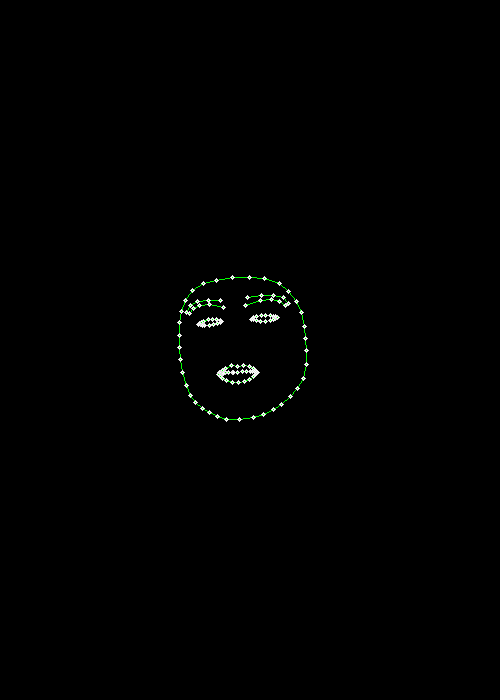
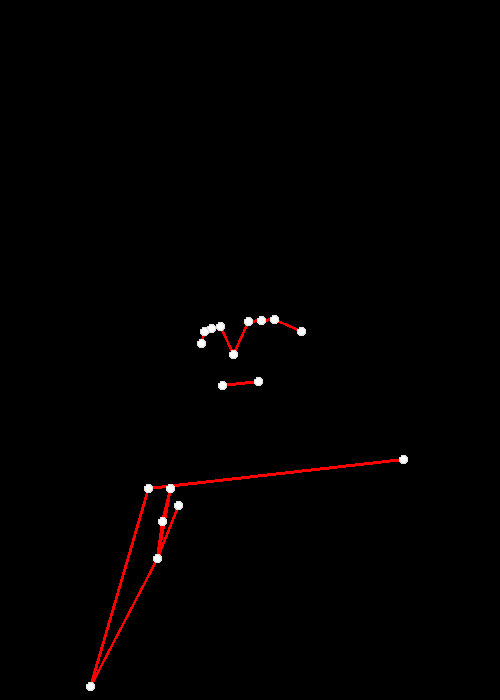
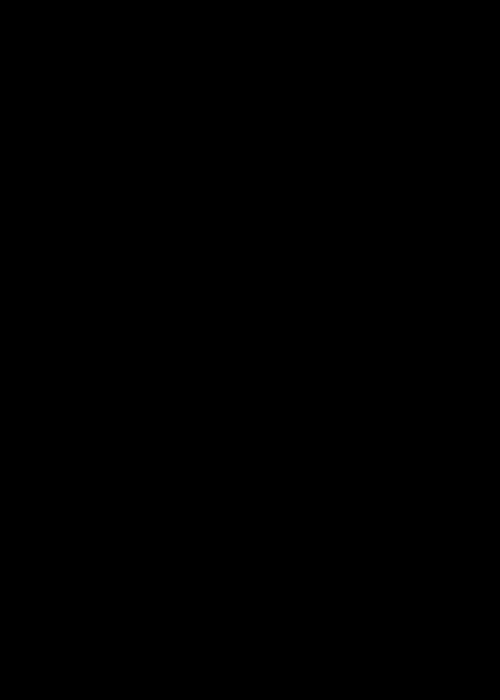
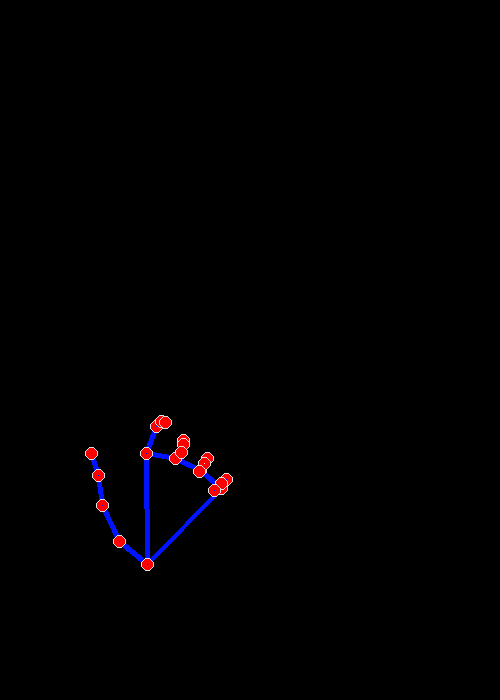
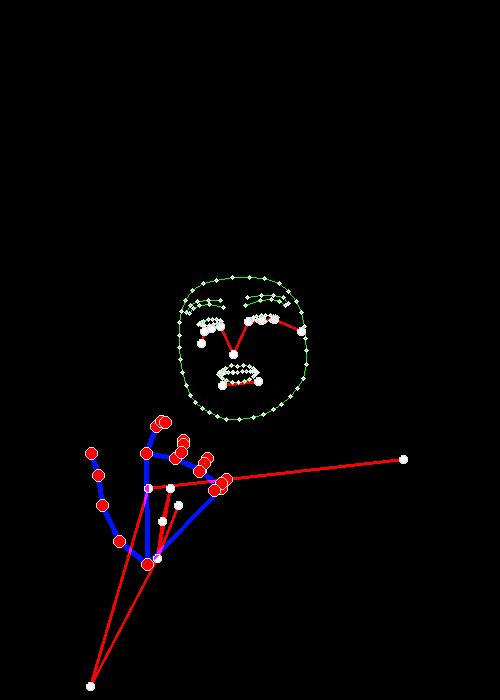
...
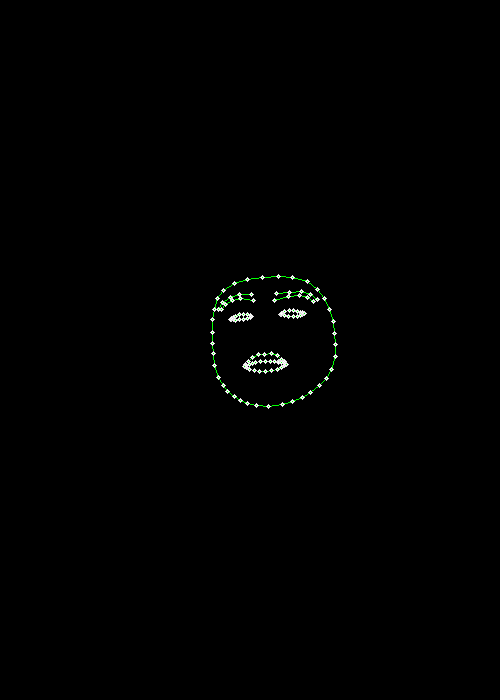
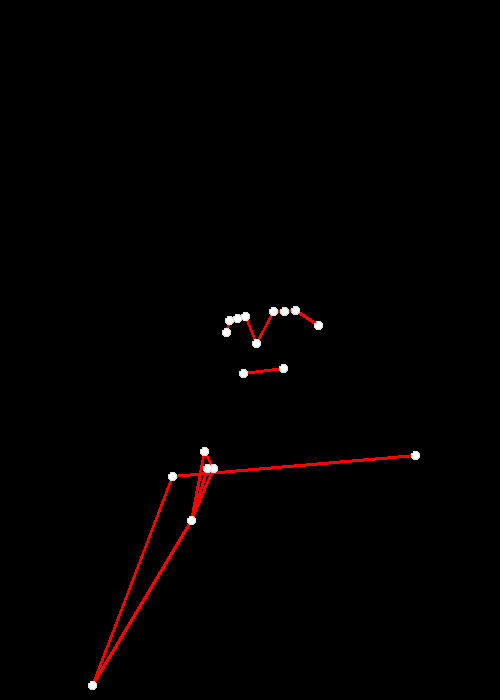
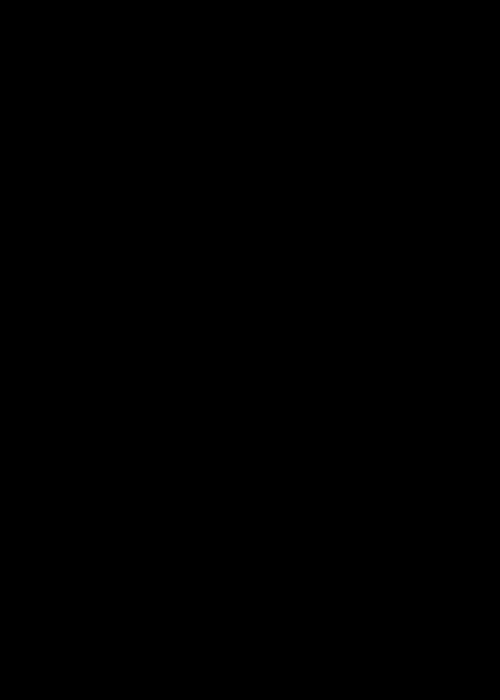
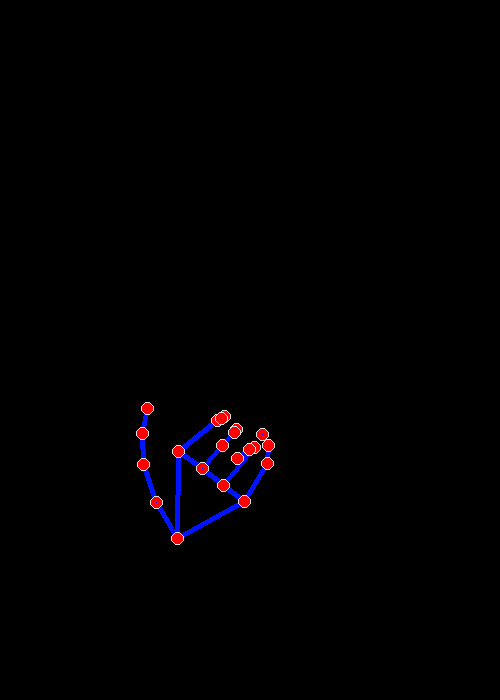
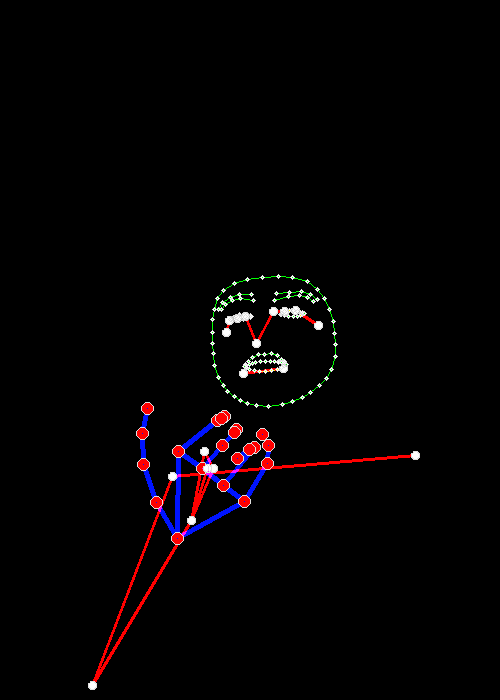

In [117]:
mp_drawing = mp.solutions.drawing_utils
mp_hands = mp.solutions.hands
mp_face_mesh = mp.solutions.face_mesh
mp_pose = mp.solutions.pose
CONTOURS = list(itertools.chain(*mp_face_mesh.FACEMESH_CONTOURS))
colors = ["#0F9D58","#4285F4","#F4B400"]

participant_id, sequence_id = get_ids(train_df[train_df['sign'] == 'wait'], 10)#
fig = draw_data(participant_id,sequence_id,train_df)
fig.show(config= dict(displayModeBar = False))